In [1]:
import yfinance as yf
import pandas as pd

### Downloading data

In [2]:
# # Define the tickers for the ETFs
# tickers = ['IVV', 'ECH', 'EWZ']

# # Define the start and end dates
# start_date = '2009-12-12'
# end_date = '2020-01-01'

# # Process each ticker separately
# for ticker in tickers:
#     # Download the data for the ETF
#     df = yf.download(ticker, start=start_date, end=end_date)
#     df['Ticker'] = ticker  # Add a column for the ticker

#     # Reset the index to make 'Date' a column
#     df.reset_index(inplace=True)

#     # Remove the second header in the data DataFrame
#     df.columns = df.columns.droplevel(1)

#     # Check if 'Adj Close' exists in the DataFrame
#     if 'Adj Close' in df.columns:
#         # Select the required columns including 'Adj Close'
#         df = df[['Date', 'Ticker', 'Close', 'Adj Close', 'High', 'Low', 'Open', 'Volume']]
#     else:
#         # Select the required columns excluding 'Adj Close'
#         df = df[['Date', 'Ticker', 'Close', 'High', 'Low', 'Open', 'Volume']]

#     # Save the DataFrame to a CSV file in the data folder
#     df.to_csv(f'data/{ticker}_data.csv', index=False)

In [3]:
# Read the data from the CSV files and combine them into a single DataFrame
data_files = ['data/IVV_data.csv', 'data/ECH_data.csv', 'data/EWZ_data.csv']
data = pd.concat([pd.read_csv(file, parse_dates=['Date']) for file in data_files], ignore_index=True)
data['Date'] = pd.to_datetime(data['Date'])
data.set_index('Date', inplace=True)
# Display the first few rows of the combined DataFrame
print(data.head())

print('Tickers:')
print(data['Ticker'].unique())
print(data.columns)



           Ticker      Close       High        Low       Open   Volume
Date                                                                  
2009-12-14    IVV  84.676102  84.774183  84.298858  84.691189  3201000
2009-12-15    IVV  84.268700  84.721391  84.027264  84.389415  2537100
2009-12-16    IVV  84.427147  84.872292  84.238525  84.638402  2842400
2009-12-17    IVV  83.355736  83.951776  83.325556  83.808427  7247700
2009-12-18    IVV  83.883919  83.936733  83.159611  83.853739  4320400
Tickers:
['IVV' 'ECH' 'EWZ']
Index(['Ticker', 'Close', 'High', 'Low', 'Open', 'Volume'], dtype='object')


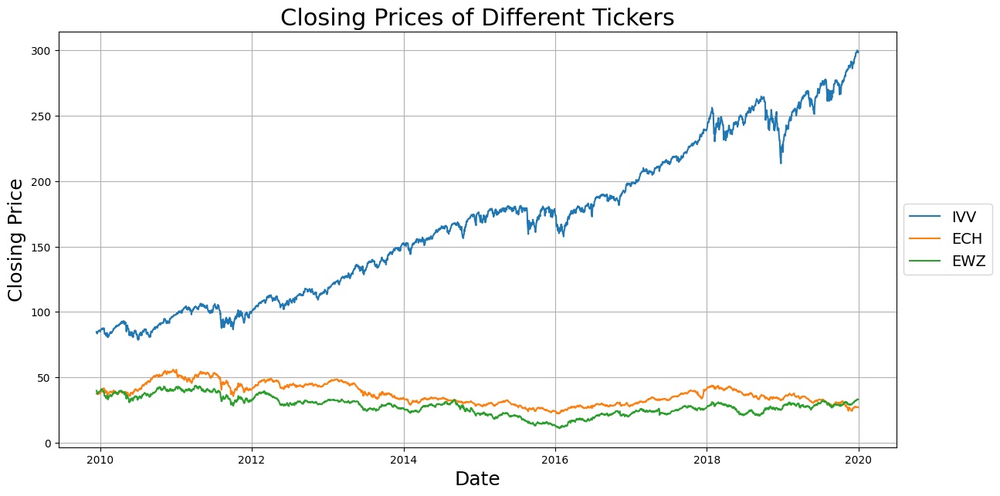

In [4]:
import matplotlib.pyplot as plt

# Plot all different tickers in the dataset for the min to max date
plt.figure(figsize=(14, 7))

for ticker in data['Ticker'].unique():
    ticker_data = data[data['Ticker'] == ticker]
    plt.plot(ticker_data.index, ticker_data['Close'], label=ticker)

plt.title('Closing Prices of Different Tickers', fontsize=22)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Closing Price', fontsize=18)
plt.grid(True)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=14)
plt.show()


### Computing indicators

In [5]:
import pandas_ta as ta
from sklearn.preprocessing import MinMaxScaler

# Initialize an empty DataFrame to store processed data
processed_data = pd.DataFrame()

# Process each ticker separately
for ticker in data['Ticker'].unique():
    ticker_data = data[data['Ticker'] == ticker].copy()

    # Take 'Ticker' column apart
    ticker_column = ticker_data.pop('Ticker')

    try:
        # Calculate all technical indicators using pandas_ta
        ticker_data.ta.strategy(ta.AllStrategy)

        # Clean NaN values by filling them with the column mean
        ticker_data.fillna(ticker_data.mean(), inplace=True)

        # Normalize the DataFrame using Min-Max scaling
        scaler = MinMaxScaler()
        ticker_data = pd.DataFrame(scaler.fit_transform(ticker_data), columns=ticker_data.columns, index=ticker_data.index)

        # Define the target variable 'I' based on the opening price change
        ticker_data['I'] = ticker_data['Open'].diff().apply(lambda x: 1 if x > 0 else -1)

        # Add the 'Ticker' column back to the DataFrame
        ticker_data['Ticker'] = ticker_column

        # Append the processed ticker data to the processed_data DataFrame
        processed_data = pd.concat([processed_data, ticker_data])
    except Exception as e:
        print(f"Processing failed for ticker {ticker}: {e}")

# Display the first few rows of the processed DataFrame with new columns
print(processed_data.head())

/Users/beto/.pyenv/versions/3.10.11/lib/python3.10/multiprocessing/pool.py:48: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return list(map(*args))
/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/pandas_ta/candles/ha.py:25: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` inst

               Close      High       Low      Open    Volume  ABER_ZG_5_15  \
Date                                                                         
2009-12-14  0.027859  0.024270  0.073017  0.024873  0.065589      0.401253   
2009-12-15  0.026020  0.024032  0.071847  0.023511  0.048138      0.401253   
2009-12-16  0.026735  0.024713  0.072757  0.024635  0.056163      0.401253   
2009-12-17  0.021898  0.020556  0.068824  0.020890  0.171962      0.401253   
2009-12-18  0.024283  0.020488  0.068109  0.021094  0.095014      0.022085   

            ABER_SG_5_15  ABER_XG_5_15  ABER_ATR_5_15  ACCBL_20  ...  \
Date                                                             ...   
2009-12-14       0.40302      0.402769       0.207315  0.402127  ...   
2009-12-15       0.40302      0.402769       0.207315  0.402127  ...   
2009-12-16       0.40302      0.402769       0.207315  0.402127  ...   
2009-12-17       0.40302      0.402769       0.207315  0.402127  ...   
2009-12-18       0.40

In [6]:
print(processed_data.columns)
print(len(processed_data.columns))

Index(['Close', 'High', 'Low', 'Open', 'Volume', 'ABER_ZG_5_15',
       'ABER_SG_5_15', 'ABER_XG_5_15', 'ABER_ATR_5_15', 'ACCBL_20',
       ...
       'VTXM_14', 'VWAP_D', 'VWMA_10', 'WCP', 'WILLR_14', 'WMA_10',
       'ZL_EMA_10', 'ZS_30', 'I', 'Ticker'],
      dtype='object', length=285)
285


In [7]:
print(processed_data['Ticker'].unique())
print(len(processed_data))

['IVV' 'ECH' 'EWZ']
7587


/var/folders/zt/2fc2dgl527j0fpwfk176q2k40000gn/T/ipykernel_60946/3805687654.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ticker_data['Cumulative_I'] = ticker_data['I'].cumsum()
/var/folders/zt/2fc2dgl527j0fpwfk176q2k40000gn/T/ipykernel_60946/3805687654.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ticker_data['Cumulative_I'] = ticker_data['I'].cumsum()
/var/folders/zt/2fc2dgl527j0fpwfk176q2k40000gn/T/ipykernel_60946/3805687654.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy

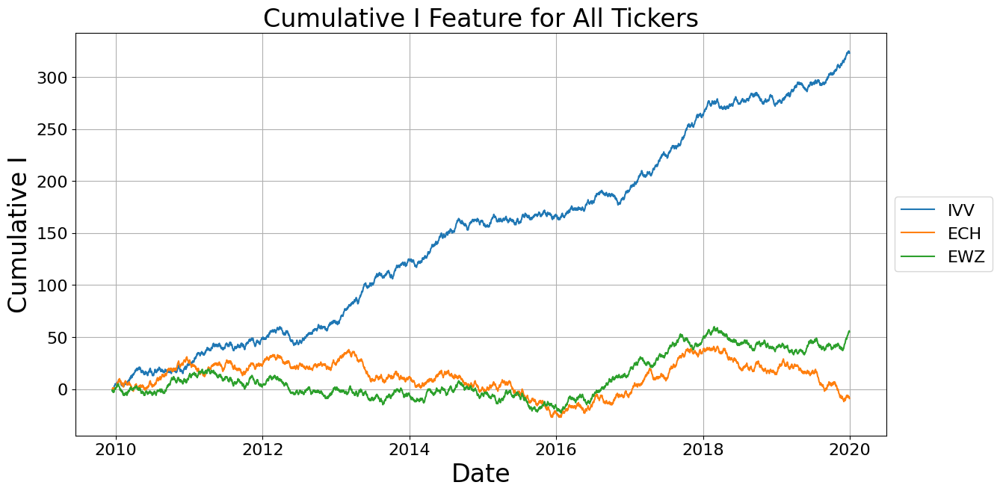

In [8]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

# Plot the cumulative 'I' feature for each ticker
for ticker in processed_data['Ticker'].unique():
    ticker_data = processed_data[processed_data['Ticker'] == ticker]
    ticker_data['Cumulative_I'] = ticker_data['I'].cumsum()

    plt.plot(ticker_data.index, ticker_data['Cumulative_I'], label=f'{ticker}')

plt.title('Cumulative I Feature for All Tickers', fontsize=24)
plt.xlabel('Date', fontsize=24)
plt.ylabel('Cumulative I', fontsize=24)
plt.grid(True)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()


### Feature sellection

In [9]:
import pandas as pd
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import VarianceThreshold, chi2
from sklearn.linear_model import LassoCV
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np

def feature_selection(X, y):
    """
    Selects relevant features using various statistical methods.

    Args:
      X: DataFrame with features.
      y: Series with target variable.

    Returns:
      list: List of selected features.
    """
    selected_features_dict = {}  # Initialize dictionary to store results

    # Low Variance
    selector = VarianceThreshold(threshold=0.05)
    selector.fit(X)
    low_var_features = X.columns[selector.get_support()].tolist()
    selected_features_dict['Low Variance'] = {
        'count': len(low_var_features),
        'features': low_var_features
    }

    # Chi-Squared
    chi2_scores, _ = chi2(X, y)
    chi2_features = X.columns[np.argsort(chi2_scores)[-int(len(X.columns) * 0.25):]].tolist()
    selected_features_dict['Chi-Squared'] = {
        'count': len(chi2_features),
        'features': chi2_features
    }

    # LASSO
    lasso = LassoCV(cv=5, random_state=1).fit(X, y)
    lasso_features = X.columns[lasso.coef_ != 0].tolist()
    selected_features_dict['LASSO'] = {
        'count': len(lasso_features),
        'features': lasso_features
    }

    # Tree-based
    tree_clf = ExtraTreesClassifier(n_estimators=50, random_state=1).fit(X, y)
    tree_features = X.columns[np.argsort(tree_clf.feature_importances_)[-int(len(X.columns) * 0.25):]].tolist()
    selected_features_dict['Tree-based'] = {
        'count': len(tree_features),
        'features': tree_features
    }

    # Pearson's Correlation (remove highly correlated features)
    corr_matrix = X.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
    X_corr = X.drop(columns=to_drop)
    corr_features = X_corr.columns.tolist()
    selected_features_dict['Pearson Correlation'] = {
        'count': len(corr_features),  # Store the count of remaining features
        'features': corr_features
    }

    # Principal Feature Analysis
    pca = PCA(n_components=0.95, random_state=1)
    pca.fit(StandardScaler().fit_transform(X))
    pca_features = X.columns[pca.components_.argmax(axis=0)].tolist()
    selected_features_dict['PCA'] = {
        'count': len(pca_features),
        'features': pca_features
    }
    
    # Mean Absolute Difference (MAD)
    mad_scores = np.mean(np.abs(X - X.mean()), axis=0)  # Use numpy.mean_absolute_deviation
    mad_features = X.columns[np.argsort(mad_scores)[-int(len(X.columns) * 0.25):]].tolist()
    selected_features_dict['MAD'] = {
        'count': len(mad_features),
        'features': mad_features
    }

    # Dispersion Ratio (DR)
    dr_scores = X.max(axis=0) - X.min(axis=0)  # Calculate range as a proxy for DR
    dr_features = X.columns[np.argsort(dr_scores)[-int(len(X.columns) * 0.25):]].tolist()
    selected_features_dict['DR'] = {
        'count': len(dr_features),
        'features': dr_features
    }

    # Combine selected features (for MLP training)
    selected_features = list(
        set(low_var_features + chi2_features + lasso_features + tree_features + 
            corr_features + pca_features + mad_features + dr_features)
    )

    return selected_features, selected_features_dict

# Assuming your data is in a DataFrame called 'processed_data'
tickers = processed_data['Ticker'].unique()

results_dict = {}  # Dictionary to store results by ticker

for ticker in tickers:
    ticker_data = processed_data[processed_data['Ticker'] == ticker].copy()
    
    # Separate features and target variable
    X = ticker_data.drop(columns=['I', 'Ticker'])
    y = ticker_data['I']
    
    # Select features
    selected_features, selected_features_dict = feature_selection(X, y)
    
    # Print logging information
    print(f"Ticker: {ticker}")
    for method, data in selected_features_dict.items():
        print(f"{method} - Selected {data['count']} features: {data['features']}")
    print(f"Final selected features: {selected_features}\n")
    
    # Prepare data for MLP
    X_selected = X[selected_features]

    # Initialize MLP classifier
    mlp = MLPClassifier(
        hidden_layer_sizes=int((X_selected.shape[1] + len(np.unique(y))) / 2),
        activation='logistic',
        solver='lbfgs',
        learning_rate_init=0.03,
        max_iter=5000,
        random_state=1,
    )

    # Cross-validation
    cv = StratifiedKFold(n_splits=10, shuffle=False)
    accuracies_by_method = {
        method: [] for method in selected_features_dict.keys()
    }  # Store accuracies by method
    for train_index, test_index in cv.split(X_selected, y):
        X_train, X_test = X_selected.iloc[train_index], X_selected.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        for method, data in selected_features_dict.items():
            X_train_method = X_train[data['features']]
            X_test_method = X_test[data['features']]
            mlp.fit(X_train_method, y_train)
            accuracy = mlp.score(X_test_method, y_test)
            accuracies_by_method[method].append(accuracy)

    # Calculate median accuracy for each method
    median_accuracies = {
        method: np.median(accuracies) for method, accuracies in accuracies_by_method.items()
    }
    
    # Store results for the ticker, including median accuracies by method
    results_dict[ticker] = {
        'selected_features': selected_features_dict,
        'median_accuracies': median_accuracies
    }

    print("Median Accuracies by Method:")
    for method, median_accuracy in median_accuracies.items():
        print(f"{method}: {median_accuracy:.4f}")
    print("\n")

# Replicate Table 3 (one row per ticker)
print("Table 3:")
print("-" * 90)
header = "{:<10} {:<12} {:<12} {:<12} {:<12} {:<12} {:<12} {:<12} {:<12}".format(
    "Ticker", "Low Var", "Chi-Sq", "LASSO", "Tree", "Pearson", "PCA", "MAD", "DR"
)
print(header)
print("-" * 90)
for ticker, data in results_dict.items():
    row = "{:<10}".format(ticker)
    methods = data['selected_features']  # Access the nested dictionary
    for method in ["Low Variance", "Chi-Squared", "LASSO", "Tree-based", "Pearson Correlation", "PCA", "MAD", "DR"]:
        row += " {:<12}".format(methods[method]['count'])
    print(row)
print("-" * 90)

# Replicate Table 4 (one row per ticker, percentages)
print("\nTable 4:")
print("-" * 90)
print(header)  # Same header as Table 3
print("-" * 90)
for ticker, data in results_dict.items():
    row = "{:<10}".format(ticker)
    median_accuracies = data['median_accuracies']  # Access the median accuracies
    for method in ["Low Variance", "Chi-Squared", "LASSO", "Tree-based", "Pearson Correlation", "PCA", "MAD", "DR"]:
        row += " {:<12.2f}%".format(median_accuracies[method] * 100)  # Format as percentage
    print(row)
print("-" * 90)

/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.2629114800837442, tolerance: 0.1984521997034109
  model = cd_fast.enet_coordinate_descent_gram(
/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.2793949826414064, tolerance: 0.1984521997034109
  model = cd_fast.enet_coordinate_descent_gram(
/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.9709049044770381, tolerance: 0.1984521997034109
  model = cd_fast.enet_coordinate_descent_gram(
/Use

Ticker: IVV
Low Variance - Selected 120 features: ['Close', 'High', 'Low', 'Open', 'ABER_ZG_5_15', 'ABER_SG_5_15', 'ABER_XG_5_15', 'ACCBL_20', 'ACCBM_20', 'ACCBU_20', 'AD', 'AMATe_LR_8_21_2', 'AMATe_SR_8_21_2', 'OBV', 'OBV_min_2', 'OBV_max_2', 'OBVe_4', 'OBVe_12', 'AOBV_LR_2', 'AOBV_SR_2', 'AROOND_14', 'AROONU_14', 'AROONOSC_14', 'BBL_5_2.0', 'BBM_5_2.0', 'BBU_5_2.0', 'BBP_5_2.0', 'BOP', 'CDL_DOJI_10_0.1', 'CDL_LONGLEGGEDDOJI', 'CDL_RICKSHAWMAN', 'CDL_SPINNINGTOP', 'CKSPl_10_3_20', 'CKSPs_10_3_20', 'CTI_12', 'LDECAY_5', 'DEC_1', 'DEMA_10', 'DCL_20_20', 'DCM_20_20', 'DCU_20_20', 'EBSW_40_10', 'EMA_10', 'ER_10', 'FWMA_10', 'HA_open', 'HA_high', 'HA_low', 'HA_close', 'HILO_13_21', 'HILOl_13_21', 'HL2', 'HLC3', 'HMA_10', 'HWM', 'HWU', 'HWL', 'HWMA_0.2_0.1_0.1', 'ISA_9', 'ISB_26', 'ITS_9', 'IKS_26', 'ICS_26', 'INC_1', 'JMA_7_0', 'KCLe_20_2', 'KCBe_20_2', 'KCUe_20_2', 'K_9_3', 'D_9_3', 'J_9_3', 'LR_14', 'MCGD_10', 'MEDIAN_30', 'MIDPOINT_2', 'MIDPRICE_2', 'NVI_1', 'OHLC4', 'PSARaf_0.02_0.2', 

/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.25877737613382124, tolerance: 0.20224616905585763
  model = cd_fast.enet_coordinate_descent_gram(
/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.5157533358226374, tolerance: 0.20224616905585763
  model = cd_fast.enet_coordinate_descent_gram(
/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.147760649751035, tolerance: 0.20224616905585763
  model = cd_fast.enet_coordinate_descent_gram(
/

Ticker: ECH
Low Variance - Selected 114 features: ['Close', 'High', 'Open', 'ABER_ZG_5_15', 'ABER_SG_5_15', 'ABER_XG_5_15', 'ACCBL_20', 'ACCBM_20', 'ACCBU_20', 'AD', 'AMATe_LR_8_21_2', 'AMATe_SR_8_21_2', 'OBV', 'OBV_min_2', 'OBV_max_2', 'OBVe_4', 'OBVe_12', 'AOBV_LR_2', 'AOBV_SR_2', 'AROOND_14', 'AROONU_14', 'AROONOSC_14', 'BBL_5_2.0', 'BBM_5_2.0', 'BBU_5_2.0', 'BBP_5_2.0', 'BOP', 'CDL_DOJI_10_0.1', 'CDL_LONGLEGGEDDOJI', 'CDL_LONGLINE', 'CDL_RICKSHAWMAN', 'CKSPl_10_3_20', 'CKSPs_10_3_20', 'CTI_12', 'LDECAY_5', 'DEC_1', 'DEMA_10', 'DCM_20_20', 'DCU_20_20', 'EBSW_40_10', 'EMA_10', 'ER_10', 'FWMA_10', 'HA_open', 'HA_high', 'HA_close', 'HILO_13_21', 'HL2', 'HLC3', 'HMA_10', 'HWM', 'HWU', 'HWL', 'HWMA_0.2_0.1_0.1', 'ISA_9', 'ISB_26', 'ITS_9', 'IKS_26', 'ICS_26', 'INC_1', 'JMA_7_0', 'KCLe_20_2', 'KCBe_20_2', 'KCUe_20_2', 'K_9_3', 'D_9_3', 'J_9_3', 'LR_14', 'MCGD_10', 'MEDIAN_30', 'MIDPOINT_2', 'MIDPRICE_2', 'OHLC4', 'PSARaf_0.02_0.2', 'PSARr_0.02_0.2', 'PVR', 'PWMA_10', 'QTL_30_0.5', 'RMA_10

/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.6116856452305228, tolerance: 0.20217142857142842
  model = cd_fast.enet_coordinate_descent_gram(
/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.8299354811838384, tolerance: 0.20217142857142842
  model = cd_fast.enet_coordinate_descent_gram(
/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.968737207668596, tolerance: 0.20217142857142842
  model = cd_fast.enet_coordinate_descent_gram(
/U

Ticker: EWZ
Low Variance - Selected 67 features: ['ACCBM_20', 'ACCBU_20', 'AD', 'AMATe_LR_8_21_2', 'AMATe_SR_8_21_2', 'AOBV_LR_2', 'AOBV_SR_2', 'AROOND_14', 'AROONU_14', 'AROONOSC_14', 'BBP_5_2.0', 'BOP', 'CDL_DOJI_10_0.1', 'CDL_LONGLEGGEDDOJI', 'CDL_LONGLINE', 'CDL_RICKSHAWMAN', 'CDL_SPINNINGTOP', 'CKSPl_10_3_20', 'CKSPs_10_3_20', 'CTI_12', 'DEC_1', 'DCL_20_20', 'DCM_20_20', 'DCU_20_20', 'EBSW_40_10', 'ISA_9', 'ISB_26', 'IKS_26', 'INC_1', 'KCLe_20_2', 'KCBe_20_2', 'KCUe_20_2', 'K_9_3', 'D_9_3', 'J_9_3', 'MCGD_10', 'MEDIAN_30', 'PSARaf_0.02_0.2', 'PSARr_0.02_0.2', 'PVI_1', 'PVR', 'PVT', 'QTL_30_0.5', 'RMA_10', 'SQZ_ON', 'SQZ_OFF', 'SQZPRO_ON_WIDE', 'SQZPRO_ON_NORMAL', 'SQZPRO_OFF', 'STC_10_12_26_0.5', 'STCstoch_10_12_26_0.5', 'STOCHk_14_3_3', 'STOCHd_14_3_3', 'STOCHRSIk_14_14_3_3', 'STOCHRSId_14_14_3_3', 'SUPERTd_7_3.0', 'THERMOl_20_2_0.5', 'THERMOs_20_2_0.5', 'TOS_STDEVALL_LR', 'TOS_STDEVALL_L_1', 'TOS_STDEVALL_U_1', 'TOS_STDEVALL_L_2', 'TOS_STDEVALL_U_2', 'TOS_STDEVALL_L_3', 'TOS_STD

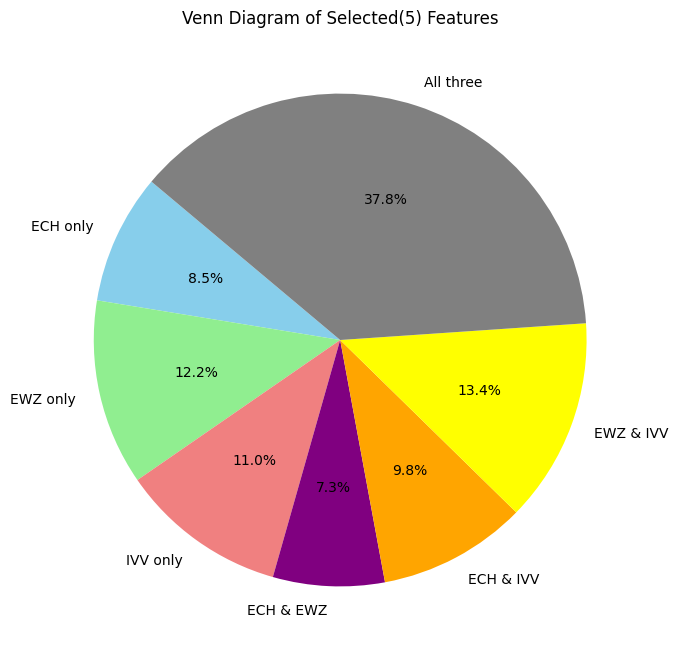

In [14]:
import matplotlib.pyplot as plt

# Assuming results_dict is available from the previous code execution

# Extract sets of features for each ticker
sets = {}
for ticker, data in results_dict.items():
    sets[ticker] = set(data['selected_features']['Selected(5)']['features'])

# Calculate set intersections and differences
ech_only = sets['ECH'] - sets['EWZ'] - sets['IVV']
ewz_only = sets['EWZ'] - sets['ECH'] - sets['IVV']
ivv_only = sets['IVV'] - sets['ECH'] - sets['EWZ']
ech_ewz = sets['ECH'] & sets['EWZ'] - sets['IVV']
ech_ivv = sets['ECH'] & sets['IVV'] - sets['EWZ']
ewz_ivv = sets['EWZ'] & sets['IVV'] - sets['ECH']
all_three = sets['ECH'] & sets['EWZ'] & sets['IVV']

# Create the Venn diagram
plt.figure(figsize=(8, 8))
plt.pie(
    [
        len(ech_only),
        len(ewz_only),
        len(ivv_only),
        len(ech_ewz),
        len(ech_ivv),
        len(ewz_ivv),
        len(all_three),
    ],
    labels=['ECH only', 'EWZ only', 'IVV only', 'ECH & EWZ', 'ECH & IVV', 'EWZ & IVV', 'All three'],
    colors=['skyblue', 'lightgreen', 'lightcoral', 'purple', 'orange', 'yellow', 'gray'],
    autopct='%1.1f%%',
    startangle=140,
)

# Add a title
plt.title('Venn Diagram of Selected(5) Features')

# Show the plot
plt.show()

### calculating selected(5)


Ticker: IVV, Selected(5) Features: ['AOBV_LR_2', 'AROOND_14', 'AMATe_LR_8_21_2', 'ADOSC_3_10', 'ACCBL_20', 'STOCHRSIk_14_14_3_3', 'AMATe_SR_8_21_2', 'BOP', 'CDL_HIKKAKE', 'AROONU_14']
Ticker: ECH, Selected(5) Features: ['DMP_14', 'AOBV_LR_2', 'ABER_XG_5_15', 'CDL_HANGINGMAN', 'AD', 'AMATe_LR_8_21_2', 'ADX_14', 'AROOND_14', 'EBSW_40_10', 'BBB_5_2.0']
Ticker: EWZ, Selected(5) Features: ['ABER_ZG_5_15', 'ADOSC_3_10', 'BBP_5_2.0', 'AMATe_LR_8_21_2', 'AOBV_LR_2', 'DMP_14', 'CDL_HARAMI', 'AD', 'DEC_1', 'CTI_12']


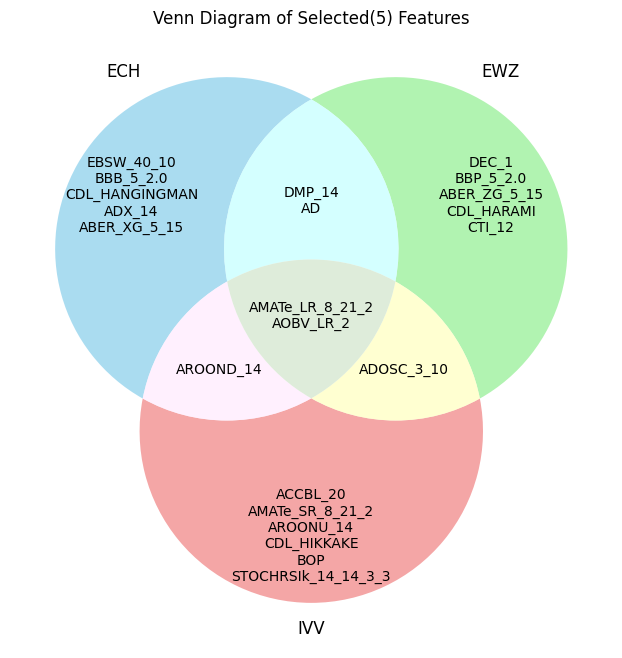

In [15]:
# Assuming results_dict is available from the previous code execution
from matplotlib_venn import venn3

# Calculate 'Selected(5)' for each ticker
for ticker, data in results_dict.items():
    # Combine all features selected by each method
    all_features = []
    for method, method_data in data['selected_features'].items():
        all_features.extend(method_data['features'])

    # Count occurrences of each feature
    feature_counts = pd.Series(all_features).value_counts()

    # Exclude original features like 'Open', 'Close', etc.
    excluded_features = {'Open', 'Close', 'High', 'Low', 'Volume'}
    filtered_features = [feature for feature in feature_counts.index if feature not in excluded_features]

    # Select the first 10 features that appear in at least 5 methods
    selected_5_features = [feature for feature in filtered_features if feature_counts[feature] >= 5][:10]

    # Store 'Selected(5)' in the results_dict
    data['selected_features']['Selected(5)'] = {'features': selected_5_features}

    # Print the 'Selected(5)' features for each ticker
    print(f"Ticker: {ticker}, Selected(5) Features: {selected_5_features}")

# Extract sets of features for each ticker for the Venn diagram
sets = {}
for ticker, data in results_dict.items():
    sets[ticker] = set(data['selected_features']['Selected(5)']['features'])

# Create the Venn diagram
plt.figure(figsize=(8, 8))
venn = venn3(
    [sets['ECH'], sets['EWZ'], sets['IVV']],
    set_labels=('ECH', 'EWZ', 'IVV'),
    set_colors=('skyblue', 'lightgreen', 'lightcoral'),
    alpha=0.7,
)

# Annotate the Venn diagram with feature names
for region, features in zip(['100', '010', '001', '110', '101', '011', '111'], 
                            [sets['ECH'] - sets['EWZ'] - sets['IVV'],
                             sets['EWZ'] - sets['ECH'] - sets['IVV'],
                             sets['IVV'] - sets['ECH'] - sets['EWZ'],
                             sets['ECH'] & sets['EWZ'] - sets['IVV'],
                             sets['ECH'] & sets['IVV'] - sets['EWZ'],
                             sets['EWZ'] & sets['IVV'] - sets['ECH'],
                             sets['ECH'] & sets['EWZ'] & sets['IVV']]):
    if venn.get_label_by_id(region):
        venn.get_label_by_id(region).set_text('\n'.join(features))

# Add a title
plt.title('Venn Diagram of Selected(5) Features')

# Show the plot
plt.show()

Ticker: IVV, Selected(5) Features: ['Close', 'High', 'AOBV_LR_2', 'Low', 'AROOND_14', 'AMATe_LR_8_21_2', 'ADOSC_3_10', 'Open', 'ACCBL_20', 'STOCHRSIk_14_14_3_3', 'CDL_HIKKAKE', 'AMATe_SR_8_21_2', 'BOP', 'AROONU_14', 'ABER_ZG_5_15', 'OBVe_4', 'DMN_14', 'DEC_1', 'CDL_HIGHWAVE', 'CTI_12', 'CDL_DRAGONFLYDOJI', 'CCI_14_0.015', 'WILLR_14', 'TTM_TRND_6', 'STOCHRSId_14_14_3_3', 'PVR', 'CDL_DOJI_10_0.1', 'EBSW_40_10', 'BBP_5_2.0', 'AROONOSC_14', 'ABER_SG_5_15', 'ABER_XG_5_15', 'ACCBM_20', 'CDL_HIKKAKEMOD', 'Volume', 'AOBV_SR_2', 'STC_10_12_26_0.5', 'THERMOs_20_2_0.5', 'CDL_HANGINGMAN', 'open_Z_30_1', 'FISHERT_9_1', 'CDL_LONGLEGGEDDOJI', 'AD', 'ACCBU_20', 'K_9_3', 'OBV', 'SUPERTd_7_3.0', 'CDL_ENGULFING', 'CDL_HAMMER', 'CDL_BREAKAWAY', 'CFO_9', 'BULLP_13', 'STOCHk_14_3_3', 'ER_10', 'STCstoch_10_12_26_0.5', 'CDL_RICKSHAWMAN', 'BBB_5_2.0', 'AR_26', 'D_9_3']
Ticker: ECH, Selected(5) Features: ['Close', 'High', 'Volume', 'Low', 'DMP_14', 'AOBV_LR_2', 'ABER_XG_5_15', 'CDL_HANGINGMAN', 'AD', 'AMATe_LR_

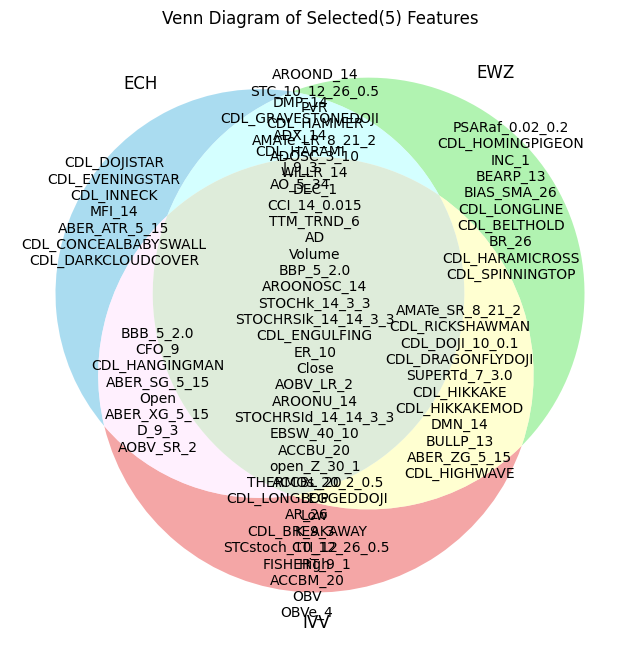

In [16]:

# Assuming results_dict is available from the previous code execution

# Calculate 'Selected(5)' for each ticker
for ticker, data in results_dict.items():
    # Combine all features selected by each method
    all_features = []
    for method, method_data in data['selected_features'].items():
        all_features.extend(method_data['features'])

    # Count occurrences of each feature
    feature_counts = pd.Series(all_features).value_counts()

    # Select features that appear in at least 5 methods
    selected_5_features = feature_counts[feature_counts >= 5].index.tolist()

    # Store 'Selected(5)' in the results_dict
    data['selected_features']['Selected(5)'] = {'features': selected_5_features}

    # Print the 'Selected(5)' features for each ticker
    print(f"Ticker: {ticker}, Selected(5) Features: {selected_5_features}")

# Extract sets of features for each ticker for the Venn diagram
sets = {}
for ticker, data in results_dict.items():
    sets[ticker] = set(data['selected_features']['Selected(5)']['features'])

# Create the Venn diagram
plt.figure(figsize=(8, 8))
venn = venn3(
    [sets['ECH'], sets['EWZ'], sets['IVV']],
    set_labels=('ECH', 'EWZ', 'IVV'),
    set_colors=('skyblue', 'lightgreen', 'lightcoral'),
    alpha=0.7,
)

# Annotate the Venn diagram with feature names
for region, features in zip(['100', '010', '001', '110', '101', '011', '111'], 
                            [sets['ECH'] - sets['EWZ'] - sets['IVV'],
                             sets['EWZ'] - sets['ECH'] - sets['IVV'],
                             sets['IVV'] - sets['ECH'] - sets['EWZ'],
                             sets['ECH'] & sets['EWZ'] - sets['IVV'],
                             sets['ECH'] & sets['IVV'] - sets['EWZ'],
                             sets['EWZ'] & sets['IVV'] - sets['ECH'],
                             sets['ECH'] & sets['EWZ'] & sets['IVV']]):
    if venn.get_label_by_id(region):
        venn.get_label_by_id(region).set_text('\n'.join(features))

# Add a title
plt.title('Venn Diagram of Selected(5) Features')

# Show the plot
plt.show()

Ticker: IVV, Selected(5) Features: ['AOBV_LR_2', 'AROOND_14', 'AMATe_LR_8_21_2', 'ADOSC_3_10', 'ACCBL_20', 'STOCHRSIk_14_14_3_3', 'AMATe_SR_8_21_2', 'BOP', 'CDL_HIKKAKE', 'AROONU_14', 'OBVe_4', 'DMN_14', 'ABER_ZG_5_15', 'DEC_1', 'CDL_HIGHWAVE', 'CTI_12', 'CDL_DRAGONFLYDOJI', 'CCI_14_0.015', 'WILLR_14', 'TTM_TRND_6', 'STOCHRSId_14_14_3_3', 'PVR', 'CDL_DOJI_10_0.1', 'EBSW_40_10', 'BBP_5_2.0', 'AROONOSC_14', 'ABER_SG_5_15', 'ABER_XG_5_15', 'ACCBM_20', 'CDL_HIKKAKEMOD', 'AOBV_SR_2', 'STC_10_12_26_0.5', 'THERMOs_20_2_0.5', 'CDL_HANGINGMAN', 'open_Z_30_1', 'FISHERT_9_1', 'CDL_LONGLEGGEDDOJI', 'AD', 'ACCBU_20', 'K_9_3', 'OBV', 'SUPERTd_7_3.0', 'CDL_ENGULFING', 'CDL_HAMMER', 'CDL_BREAKAWAY', 'CFO_9', 'BULLP_13', 'STOCHk_14_3_3', 'ER_10', 'STCstoch_10_12_26_0.5', 'CDL_RICKSHAWMAN', 'BBB_5_2.0', 'AR_26', 'D_9_3']
Ticker: IVV, Selected(5) Features with Excluded: ['Close', 'High', 'AOBV_LR_2', 'Low', 'AROOND_14', 'Open', 'AMATe_LR_8_21_2', 'ADOSC_3_10', 'ACCBL_20', 'STOCHRSIk_14_14_3_3', 'AMATe_SR

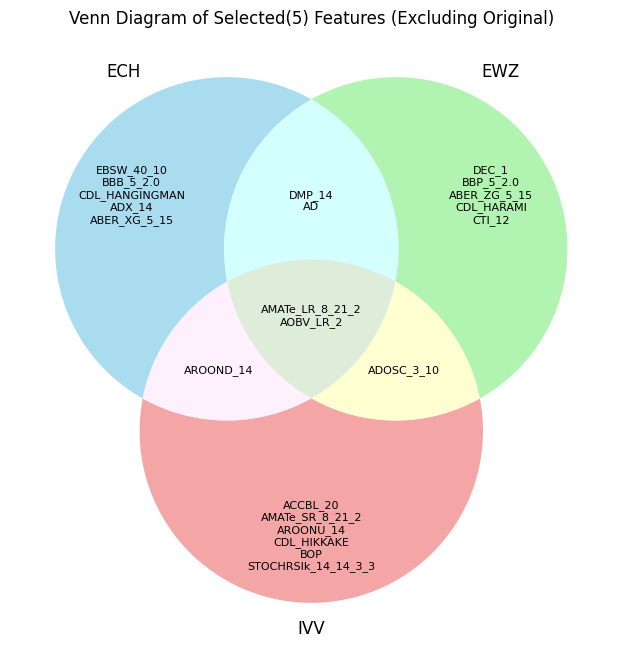

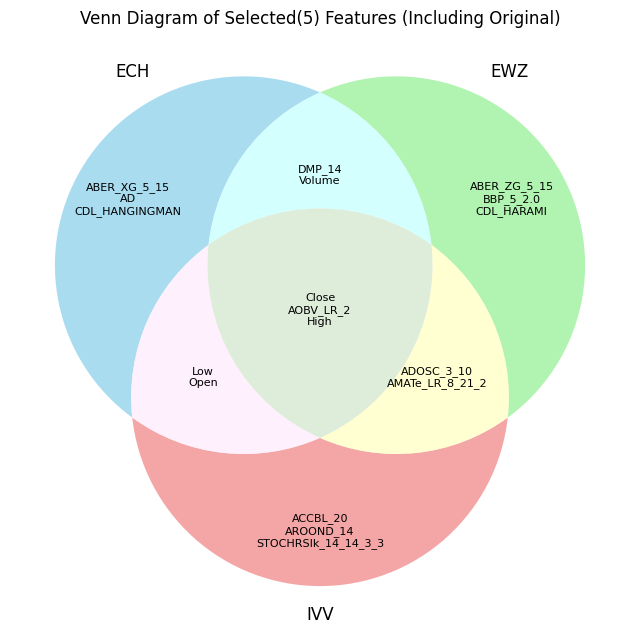

In [17]:
# Assuming results_dict is available from the previous code execution

# Calculate 'Selected(5)' for each ticker
for ticker, data in results_dict.items():
    # Combine all features selected by each method
    all_features = []
    for method, method_data in data['selected_features'].items():
        all_features.extend(method_data['features'])

    # Count occurrences of each feature
    feature_counts = pd.Series(all_features).value_counts()

    # Exclude original features like 'Open', 'Close', etc.
    excluded_features = {'Open', 'Close', 'High', 'Low', 'Volume'}
    filtered_features = [feature for feature in feature_counts.index if feature not in excluded_features]

    # Select all features that appear in at least 5 methods
    selected_5_features = [feature for feature in filtered_features if feature_counts[feature] >= 5]
    selected_5_features_with_excluded = [feature for feature in feature_counts.index if feature_counts[feature] >= 5]

    # Store 'Selected(5)' in the results_dict
    data['selected_features']['Selected(5)'] = {'features': selected_5_features}
    data['selected_features']['Selected(5)_with_excluded'] = {'features': selected_5_features_with_excluded}

    # Print the 'Selected(5)' features for each ticker
    print(f"Ticker: {ticker}, Selected(5) Features: {selected_5_features}")
    print(f"Ticker: {ticker}, Selected(5) Features with Excluded: {selected_5_features_with_excluded}")

# Extract sets of features for each ticker for the Venn diagrams
sets_excluded = {}
sets_with_excluded = {}
for ticker, data in results_dict.items():
    sets_excluded[ticker] = set(data['selected_features']['Selected(5)']['features'][:10])
    sets_with_excluded[ticker] = set(data['selected_features']['Selected(5)_with_excluded']['features'][:10])

# Create the Venn diagram excluding original features
plt.figure(figsize=(8, 8))
venn_excluded = venn3(
    [sets_excluded['ECH'], sets_excluded['EWZ'], sets_excluded['IVV']],
    set_labels=('ECH', 'EWZ', 'IVV'),
    set_colors=('skyblue', 'lightgreen', 'lightcoral'),
    alpha=0.7,
)

# Annotate the Venn diagram with feature names
for region, features in zip(['100', '010', '001', '110', '101', '011', '111'], 
                            [sets_excluded['ECH'] - sets_excluded['EWZ'] - sets_excluded['IVV'],
                             sets_excluded['EWZ'] - sets_excluded['ECH'] - sets_excluded['IVV'],
                             sets_excluded['IVV'] - sets_excluded['ECH'] - sets_excluded['EWZ'],
                             sets_excluded['ECH'] & sets_excluded['EWZ'] - sets_excluded['IVV'],
                             sets_excluded['ECH'] & sets_excluded['IVV'] - sets_excluded['EWZ'],
                             sets_excluded['EWZ'] & sets_excluded['IVV'] - sets_excluded['ECH'],
                             sets_excluded['ECH'] & sets_excluded['EWZ'] & sets_excluded['IVV']]):
    if venn_excluded.get_label_by_id(region):
        venn_excluded.get_label_by_id(region).set_text('\n'.join(features))
        venn_excluded.get_label_by_id(region).set_fontsize(8)  # Adjust font size as needed

# Add a title
plt.title('Venn Diagram of Selected(5) Features (Excluding Original)')

# Show the plot
plt.show()

# Create the Venn diagram including original features
plt.figure(figsize=(8, 8))
venn_with_excluded = venn3(
    [sets_with_excluded['ECH'], sets_with_excluded['EWZ'], sets_with_excluded['IVV']],
    set_labels=('ECH', 'EWZ', 'IVV'),
    set_colors=('skyblue', 'lightgreen', 'lightcoral'),
    alpha=0.7,
)

# Annotate the Venn diagram with feature names
for region, features in zip(['100', '010', '001', '110', '101', '011', '111'], 
                            [sets_with_excluded['ECH'] - sets_with_excluded['EWZ'] - sets_with_excluded['IVV'],
                             sets_with_excluded['EWZ'] - sets_with_excluded['ECH'] - sets_with_excluded['IVV'],
                             sets_with_excluded['IVV'] - sets_with_excluded['ECH'] - sets_with_excluded['EWZ'],
                             sets_with_excluded['ECH'] & sets_with_excluded['EWZ'] - sets_with_excluded['IVV'],
                             sets_with_excluded['ECH'] & sets_with_excluded['IVV'] - sets_with_excluded['EWZ'],
                             sets_with_excluded['EWZ'] & sets_with_excluded['IVV'] - sets_with_excluded['ECH'],
                             sets_with_excluded['ECH'] & sets_with_excluded['EWZ'] & sets_with_excluded['IVV']]):
    if venn_with_excluded.get_label_by_id(region):
        venn_with_excluded.get_label_by_id(region).set_text('\n'.join(features))
        venn_with_excluded.get_label_by_id(region).set_fontsize(8)  # Adjust font size as needed

# Add a title
plt.title('Venn Diagram of Selected(5) Features (Including Original)')

# Show the plot
plt.show()

### Final test

In [18]:
import pandas as pd
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import numpy as np
import time

# Assuming 'processed_data' and 'results_dict' are available from previous code execution

def train_and_evaluate_mlp(X_train, X_test, y_train, y_test, early_stopping=True):
    """
    Trains and evaluates an MLP classifier with early stopping.

    Args:
        X_train: Training data features.
        X_test: Test data features.
        y_train: Training data labels.
        y_test: Test data labels.
        early_stopping: Whether to use early stopping.

    Returns:
        tuple: Accuracy, training time, and number of epochs.
    """
    mlp = MLPClassifier(
        hidden_layer_sizes=int((X_train.shape[1] + len(np.unique(y_train))) / 2),
        activation='logistic',
        solver='lbfgs',
        learning_rate_init=0.03,
        max_iter=5000,
        random_state=1,
        early_stopping=early_stopping,
        validation_fraction=0.2,  # Use 20% of training data for validation
    )

    start_time = time.time()
    mlp.fit(X_train, y_train)
    end_time = time.time()
    training_time = end_time - start_time

    y_pred = mlp.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    epochs = mlp.n_iter_

    return accuracy, training_time, epochs

results_table = []  # List to store results for Table 6

for ticker, data in results_dict.items():
    ticker_data = processed_data[processed_data['Ticker'] == ticker].copy()
    
    # Separate features and target variable
    X = ticker_data.drop(columns=['I', 'Ticker'])
    y = ticker_data['I']
    
    # Split data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
    
    # Standardize the data
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    # --- Scenario 1: All indicators ---
    accuracy, training_time, epochs = train_and_evaluate_mlp(X_train, X_test, y_train, y_test)
    results_table.append([ticker, 'All', X.shape[1], accuracy * 100, training_time, epochs])
    
    # --- Scenario 2: All indicators minus original data ---
    X_train_no_orig = X_train[:, 6:]  # Assuming the first 6 columns are original data
    X_test_no_orig = X_test[:, 6:]
    accuracy, training_time, epochs = train_and_evaluate_mlp(X_train_no_orig, X_test_no_orig, y_train, y_test)
    results_table.append([ticker, 'All (no orig)', X_train_no_orig.shape[1], accuracy * 100, training_time, epochs])
    
    # --- Scenario 3: Selected(5) indicators ---
    selected_5_features = data['selected_features']['Selected(5)']['features']
    X_train_selected = X_train[:, [X.columns.get_loc(col) for col in selected_5_features]]
    X_test_selected = X_test[:, [X.columns.get_loc(col) for col in selected_5_features]]
    accuracy, training_time, epochs = train_and_evaluate_mlp(X_train_selected, X_test_selected, y_train, y_test)
    results_table.append([ticker, 'Selected(5)', X_train_selected.shape[1], accuracy * 100, training_time, epochs])
    
    # --- Scenario 4: Selected(5) indicators minus original data ---
    selected_5_features_no_orig = [col for col in selected_5_features if col not in X.columns[:6]]
    X_train_selected_no_orig = X_train[:, [X.columns.get_loc(col) for col in selected_5_features_no_orig]]
    X_test_selected_no_orig = X_test[:, [X.columns.get_loc(col) for col in selected_5_features_no_orig]]
    accuracy, training_time, epochs = train_and_evaluate_mlp(X_train_selected_no_orig, X_test_selected_no_orig, y_train, y_test)
    results_table.append([ticker, 'Selected(5) (no orig)', X_train_selected_no_orig.shape[1], accuracy * 100, training_time, epochs])

# Create and display Table 6
print("Table 6:")
print("-" * 70)
print("{:<10} {:<20} {:<10} {:<10} {:<10} {:<10}".format(
    "Ticker", "Features", "Count", "Accuracy (%)", "Time (s)", "Epochs"
))
print("-" * 70)
for row in results_table:
    print("{:<10} {:<20} {:<10} {:<10.2f} {:<10.2f} {:<10}".format(*row))
print("-" * 70)

Table 6:
----------------------------------------------------------------------
Ticker     Features             Count      Accuracy (%) Time (s)   Epochs    
----------------------------------------------------------------------
IVV        All                  283        85.97      0.49       66        
IVV        All (no orig)        277        86.76      0.49       67        
IVV        Selected(5)          54         77.67      0.10       100       
IVV        Selected(5) (no orig) 53         79.64      0.12       111       
ECH        All                  283        83.99      0.47       65        
ECH        All (no orig)        277        84.78      0.41       63        
ECH        Selected(5)          47         79.84      0.09       110       
ECH        Selected(5) (no orig) 47         79.84      0.08       110       
EWZ        All                  283        83.00      0.45       66        
EWZ        All (no orig)        277        83.20      0.43       62        
EWZ      

In [19]:
import pandas as pd
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import numpy as np
import time

# Assuming 'processed_data' and 'results_dict' are available from previous code execution

def train_and_evaluate_mlp(X_train, X_test, y_train, y_test, early_stopping=True):
    """
    Trains and evaluates an MLP classifier with early stopping.

    Args:
        X_train: Training data features.
        X_test: Test data features.
        y_train: Training data labels.
        y_test: Test data labels.
        early_stopping: Whether to use early stopping.

    Returns:
        tuple: Accuracy, training time, and number of epochs.
    """
    mlp = MLPClassifier(
        hidden_layer_sizes=int((X_train.shape[1] + len(np.unique(y_train))) / 2),
        activation='logistic',
        solver='lbfgs',
        learning_rate_init=0.03,
        max_iter=5000,
        random_state=1,
        early_stopping=early_stopping,
        validation_fraction=0.2,  # Use 20% of training data for validation
    )

    start_time = time.time()
    mlp.fit(X_train, y_train)
    end_time = time.time()
    training_time = end_time - start_time

    y_pred = mlp.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    epochs = mlp.n_iter_

    return accuracy, training_time, epochs

results_table = []  # List to store results for Table 6
features_used = []  # List to store features used in each scenario

for ticker, data in results_dict.items():
    ticker_data = processed_data[processed_data['Ticker'] == ticker].copy()
    
    # Separate features and target variable
    X = ticker_data.drop(columns=['I', 'Ticker'])
    y = ticker_data['I']
    
    # Split data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
    
    # Standardize the data
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    # --- Scenario 1: All indicators ---
    accuracy, training_time, epochs = train_and_evaluate_mlp(X_train, X_test, y_train, y_test)
    results_table.append([ticker, 'All', X.shape[1], accuracy * 100, training_time, epochs])
    features_used.append(('All', list(X.columns)))
    
    # --- Scenario 2: All indicators minus original data ---
    X_train_no_orig = X_train[:, 6:]  # Assuming the first 6 columns are original data
    X_test_no_orig = X_test[:, 6:]
    accuracy, training_time, epochs = train_and_evaluate_mlp(X_train_no_orig, X_test_no_orig, y_train, y_test)
    results_table.append([ticker, 'All (no orig)', X_train_no_orig.shape[1], accuracy * 100, training_time, epochs])
    features_used.append(('All (no orig)', list(X.columns[6:])))
    
    # --- Scenario 3: Selected(5) indicators ---
    selected_5_features = data['selected_features']['Selected(5)']['features']
    X_train_selected = X_train[:, [X.columns.get_loc(col) for col in selected_5_features]]
    X_test_selected = X_test[:, [X.columns.get_loc(col) for col in selected_5_features]]
    accuracy, training_time, epochs = train_and_evaluate_mlp(X_train_selected, X_test_selected, y_train, y_test)
    results_table.append([ticker, 'Selected(5)', X_train_selected.shape[1], accuracy * 100, training_time, epochs])
    features_used.append(('Selected(5)', selected_5_features))
    
    # --- Scenario 4: Selected(5) indicators minus original data ---
    selected_5_features_no_orig = [col for col in selected_5_features if col not in X.columns[:6]]
    X_train_selected_no_orig = X_train[:, [X.columns.get_loc(col) for col in selected_5_features_no_orig]]
    X_test_selected_no_orig = X_test[:, [X.columns.get_loc(col) for col in selected_5_features_no_orig]]
    accuracy, training_time, epochs = train_and_evaluate_mlp(X_train_selected_no_orig, X_test_selected_no_orig, y_train, y_test)
    results_table.append([ticker, 'Selected(5) (no orig)', X_train_selected_no_orig.shape[1], accuracy * 100, training_time, epochs])
    features_used.append(('Selected(5) (no orig)', selected_5_features_no_orig))
    
    # --- Scenario 5: Dynamic feature selection ---
    all_features = data['selected_features']['Selected(5)']['features']
    best_accuracy = 0
    best_features = []
    
    for i in range(5, len(all_features) + 1):
        current_features = all_features[:i]
        X_train_dyn = X_train[:, [X.columns.get_loc(col) for col in current_features]]
        X_test_dyn = X_test[:, [X.columns.get_loc(col) for col in current_features]]
        accuracy, training_time, epochs = train_and_evaluate_mlp(X_train_dyn, X_test_dyn, y_train, y_test)
        
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_features = current_features
    
    results_table.append([ticker, 'Dyn', len(best_features), best_accuracy * 100, training_time, epochs])
    features_used.append(('Dyn', best_features))

# Create and display Table 6
print("Table 6:")
print("-" * 70)
print("{:<10} {:<20} {:<10} {:<10} {:<10} {:<10}".format(
    "Ticker", "Features", "Count", "Accuracy (%)", "Time (s)", "Epochs"
))
print("-" * 70)
for row in results_table:
    print("{:<10} {:<20} {:<10} {:<10.2f} {:<10.2f} {:<10}".format(*row))
print("-" * 70)

# Display features used in each scenario
print("\nFeatures used in each scenario:")
for scenario, features in features_used:
    print(f"{scenario}: {features} (Count: {len(features)})")

# Save features_used for future access
features_used_var = features_used

/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Table 6:
----------------------------------------------------------------------
Ticker     Features             Count      Accuracy (%) Time (s)   Epochs    
----------------------------------------------------------------------
IVV        All                  283        85.97      0.51       66        
IVV        All (no orig)        277        86.76      0.44       67        
IVV        Selected(5)          54         77.67      0.09       100       
IVV        Selected(5) (no orig) 53         79.64      0.10       111       
IVV        Dyn                  49         80.63      0.09       100       
ECH        All                  283        83.99      0.42       65        
ECH        All (no orig)        277        84.78      0.40       63        
ECH        Selected(5)          47         79.84      0.08       110       
ECH        Selected(5) (no orig) 47         79.84      0.08       110       
ECH        Dyn                  42         83.40      0.09       110       
EWZ      

In [21]:
import pandas as pd
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import numpy as np
import time

# Assuming 'processed_data' and 'results_dict' are available from previous code execution

def train_and_evaluate_mlp(X_train, X_test, y_train, y_test, early_stopping=True):
    """
    Trains and evaluates an MLP classifier with early stopping.

    Args:
        X_train: Training data features.
        X_test: Test data features.
        y_train: Training data labels.
        y_test: Test data labels.
        early_stopping: Whether to use early stopping.

    Returns:
        tuple: Accuracy, training time, and number of epochs.
    """
    mlp = MLPClassifier(
        hidden_layer_sizes=int((X_train.shape[1] + len(np.unique(y_train))) / 2),
        activation='logistic',
        solver='lbfgs',
        learning_rate_init=0.03,
        max_iter=5000,
        random_state=1,
        early_stopping=early_stopping,
        validation_fraction=0.2,  # Use 20% of training data for validation
    )

    start_time = time.time()
    mlp.fit(X_train, y_train)
    end_time = time.time()
    training_time = end_time - start_time

    y_pred = mlp.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    epochs = mlp.n_iter_

    return accuracy, training_time, epochs

results_table = []  # List to store results for Table 6
features_used = []  # List to store features used in each scenario

for ticker, data in results_dict.items():
    ticker_data = processed_data[processed_data['Ticker'] == ticker].copy()
    
    # Separate features and target variable
    X = ticker_data.drop(columns=['I', 'Ticker'])
    y = ticker_data['I']
    
    # Split data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
    
    # Standardize the data
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    # --- Scenario 1: All indicators ---
    accuracy, training_time, epochs = train_and_evaluate_mlp(X_train, X_test, y_train, y_test)
    results_table.append([ticker, 'All', X.shape[1], accuracy * 100, training_time, epochs])
    features_used.append(('All', X.columns.tolist()))
    
    # --- Scenario 2: All indicators minus original data ---
    X_train_no_orig = X_train[:, 6:]  # Assuming the first 6 columns are original data
    X_test_no_orig = X_test[:, 6:]
    accuracy, training_time, epochs = train_and_evaluate_mlp(X_train_no_orig, X_test_no_orig, y_train, y_test)
    results_table.append([ticker, 'All (no orig)', X_train_no_orig.shape[1], accuracy * 100, training_time, epochs])
    features_used.append(('All (no orig)', X.columns[6:].tolist()))
    
    # --- Scenario 3: Selected(5) indicators ---
    selected_5_features = data['selected_features']['Selected(5)']['features']
    X_train_selected = X_train[:, [X.columns.get_loc(col) for col in selected_5_features]]
    X_test_selected = X_test[:, [X.columns.get_loc(col) for col in selected_5_features]]
    accuracy, training_time, epochs = train_and_evaluate_mlp(X_train_selected, X_test_selected, y_train, y_test)
    results_table.append([ticker, 'Selected(5)', X_train_selected.shape[1], accuracy * 100, training_time, epochs])
    features_used.append(('Selected(5)', selected_5_features))
    
    # --- Scenario 4: Selected(5) indicators minus original data ---
    selected_5_features_no_orig = [col for col in selected_5_features if col not in X.columns[:6]]
    X_train_selected_no_orig = X_train[:, [X.columns.get_loc(col) for col in selected_5_features_no_orig]]
    X_test_selected_no_orig = X_test[:, [X.columns.get_loc(col) for col in selected_5_features_no_orig]]
    accuracy, training_time, epochs = train_and_evaluate_mlp(X_train_selected_no_orig, X_test_selected_no_orig, y_train, y_test)
    results_table.append([ticker, 'Selected(5) (no orig)', X_train_selected_no_orig.shape[1], accuracy * 100, training_time, epochs])
    features_used.append(('Selected(5) (no orig)', selected_5_features_no_orig))
    
    # --- Scenario 5: All-Dyn indicators ---
    best_accuracy_dyn = 0
    best_num_features_dyn = 0
    best_features_dyn = []
    
    for num_features in range(10, 284):  # Vary the number of features from 10 to 283
        X_train_all_dyn = X_train[:, :num_features]
        X_test_all_dyn = X_test[:, :num_features]
        accuracy, training_time, epochs = train_and_evaluate_mlp(X_train_all_dyn, X_test_all_dyn, y_train, y_test)
        
        if accuracy > best_accuracy_dyn:
            best_accuracy_dyn = accuracy
            best_num_features_dyn = num_features
            best_features_dyn = X.columns[:num_features].tolist()
    
    results_table.append([ticker, f'All-Dyn (best)', best_num_features_dyn, best_accuracy_dyn * 100, training_time, epochs])
    features_used.append(('All-Dyn (best)', best_features_dyn))

# Create and display Table 6
print("Table 6:")
print("-" * 70)
print("{:<10} {:<20} {:<10} {:<10} {:<10} {:<10}".format(
    "Ticker", "Features", "Count", "Accuracy (%)", "Time (s)", "Epochs"
))
print("-" * 70)
for row in results_table:
    print("{:<10} {:<20} {:<10} {:<10.2f} {:<10.2f} {:<10}".format(*row))
print("-" * 70)

# Display features used in each scenario
print("\nFeatures used in each scenario:")
for scenario, features in features_used:
    print(f"{scenario}: {features} (Count: {len(features)})")

# Save features_used for future access
features_used_var = features_used

/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/beto/Documents/Projects/GWP_1/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:

Table 6:
----------------------------------------------------------------------
Ticker     Features             Count      Accuracy (%) Time (s)   Epochs    
----------------------------------------------------------------------
IVV        All                  283        85.97      0.48       66        
IVV        All (no orig)        277        86.76      0.48       67        
IVV        Selected(5)          54         77.67      0.10       100       
IVV        Selected(5) (no orig) 53         79.64      0.11       111       
IVV        All-Dyn (best)       237        86.96      0.44       66        
ECH        All                  283        83.99      0.44       65        
ECH        All (no orig)        277        84.78      0.40       63        
ECH        Selected(5)          47         79.84      0.09       110       
ECH        Selected(5) (no orig) 47         79.84      0.09       110       
ECH        All-Dyn (best)       249        86.36      0.41       65        
EWZ      

In [25]:
import pandas as pd
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
import numpy as np
import time
import ray
from itertools import combinations

# Initialize Ray only if it hasn't been initialized yet
if not ray.is_initialized():
    ray.init(ignore_reinit_error=True)

# # Initialize Ray
# ray.init(ignore_reinit_error=True)

# Assuming 'processed_data' and 'results_dict' are available from previous code execution

@ray.remote
def train_and_evaluate_mlp(X_train, X_test, y_train, y_test, early_stopping=True):
    """
    Trains and evaluates an MLP classifier with early stopping.

    Args:
        X_train: Training data features.
        X_test: Test data features.
        y_train: Training data labels.
        y_test: Test data labels.
        early_stopping: Whether to use early stopping.

    Returns:
        tuple: Accuracy, training time, and number of epochs.
    """
    mlp = MLPClassifier(
        hidden_layer_sizes=int((X_train.shape[1] + len(np.unique(y_train))) / 2),
        activation='logistic',
        solver='lbfgs',
        learning_rate_init=0.03,
        max_iter=5000,
        random_state=1,
        early_stopping=early_stopping,
        validation_fraction=0.2,  # Use 20% of training data for validation
    )

    start_time = time.time()
    mlp.fit(X_train, y_train)
    end_time = time.time()
    training_time = end_time - start_time

    y_pred = mlp.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    epochs = mlp.n_iter_

    return accuracy, training_time, epochs

results_table = []  # List to store results for Table 6
features_used = []  # List to store features used in each scenario

for ticker, data in results_dict.items():
    ticker_data = processed_data[processed_data['Ticker'] == ticker].copy()
    
    # Separate features and target variable
    X = ticker_data.drop(columns=['I', 'Ticker'])
    y = ticker_data['I']
    
    # Split data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
    
    # Standardize the data
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    # --- Scenario 1: All indicators ---
    accuracy, training_time, epochs = ray.get(train_and_evaluate_mlp.remote(X_train, X_test, y_train, y_test))
    results_table.append([ticker, 'All', X.shape[1], accuracy * 100, training_time, epochs])
    features_used.append(('All', X.columns.tolist()))
    
    # --- Scenario 2: All indicators minus original data ---
    X_train_no_orig = X_train[:, 6:]  # Assuming the first 6 columns are original data
    X_test_no_orig = X_test[:, 6:]
    accuracy, training_time, epochs = ray.get(train_and_evaluate_mlp.remote(X_train_no_orig, X_test_no_orig, y_train, y_test))
    results_table.append([ticker, 'All (no orig)', X_train_no_orig.shape[1], accuracy * 100, training_time, epochs])
    features_used.append(('All (no orig)', X.columns[6:].tolist()))
    
    # --- Scenario 3: Selected(5) indicators ---
    selected_5_features = data['selected_features']['Selected(5)']['features']
    X_train_selected = X_train[:, [X.columns.get_loc(col) for col in selected_5_features]]
    X_test_selected = X_test[:, [X.columns.get_loc(col) for col in selected_5_features]]
    accuracy, training_time, epochs = ray.get(train_and_evaluate_mlp.remote(X_train_selected, X_test_selected, y_train, y_test))
    results_table.append([ticker, 'Selected(5)', X_train_selected.shape[1], accuracy * 100, training_time, epochs])
    features_used.append(('Selected(5)', selected_5_features))
    
    # --- Scenario 4: Selected(5) indicators minus original data ---
    selected_5_features_no_orig = [col for col in selected_5_features if col not in X.columns[:6]]
    X_train_selected_no_orig = X_train[:, [X.columns.get_loc(col) for col in selected_5_features_no_orig]]
    X_test_selected_no_orig = X_test[:, [X.columns.get_loc(col) for col in selected_5_features_no_orig]]
    accuracy, training_time, epochs = ray.get(train_and_evaluate_mlp.remote(X_train_selected_no_orig, X_test_selected_no_orig, y_train, y_test))
    results_table.append([ticker, 'Selected(5) (no orig)', X_train_selected_no_orig.shape[1], accuracy * 100, training_time, epochs])
    features_used.append(('Selected(5) (no orig)', selected_5_features_no_orig))
    
    # --- Scenario 5: All-Dyn indicators ---
    best_accuracy_dyn = 0
    best_num_features_dyn = 0
    best_features_dyn = []
    
    # Use Ray to parallelize the search for the best combination of features
    @ray.remote
    def evaluate_combination(num_features):
        X_train_all_dyn = X_train[:, :num_features]
        X_test_all_dyn = X_test[:, :num_features]
        # Get the actual result from the remote function
        return ray.get(train_and_evaluate_mlp.remote(X_train_all_dyn, X_test_all_dyn, y_train, y_test))
    
    results = ray.get([evaluate_combination.remote(num_features) for num_features in range(10, 284)])

    for num_features, (accuracy, training_time, epochs) in enumerate(results, start=10):
        if accuracy > best_accuracy_dyn:
            best_accuracy_dyn = accuracy
            best_num_features_dyn = num_features
            best_features_dyn = X.columns[:num_features].tolist()
    
    results_table.append([ticker, f'All-Dyn (best)', best_num_features_dyn, best_accuracy_dyn * 100, training_time, epochs])
    features_used.append(('All-Dyn (best)', best_features_dyn))

# Create and display Table 6
print("Table 6:")
print("-" * 70)
print("{:<10} {:<20} {:<10} {:<10} {:<10} {:<10}".format(
    "Ticker", "Features", "Count", "Accuracy (%)", "Time (s)", "Epochs"
))
print("-" * 70)
for row in results_table:
    print("{:<10} {:<20} {:<10} {:<10.2f} {:<10.2f} {:<10}".format(*row))
print("-" * 70)

# Display features used in each scenario
print("\nFeatures used in each scenario:")
for scenario, features in features_used:
    print(f"{scenario}: {features} (Count: {len(features)})")

# Save features_used for future access
features_used_var = features_used

# Shutdown Ray
ray.shutdown()

2025-01-23 16:12:53,942	INFO worker.py:1672 -- Calling ray.init() again after it has already been called.


Table 6:
----------------------------------------------------------------------
Ticker     Features             Count      Accuracy (%) Time (s)   Epochs    
----------------------------------------------------------------------
IVV        All                  283        85.97      0.44       66        
IVV        All (no orig)        277        86.76      0.46       67        
IVV        Selected(5)          54         77.67      0.10       100       
IVV        Selected(5) (no orig) 53         79.64      0.11       111       
IVV        All-Dyn (best)       237        86.96      0.66       66        
ECH        All                  283        83.99      0.46       65        
ECH        All (no orig)        277        84.78      0.44       63        
ECH        Selected(5)          47         79.84      0.10       110       
ECH        Selected(5) (no orig) 47         79.84      0.10       110       
ECH        All-Dyn (best)       249        86.36      0.76       65        
EWZ      